# Setup environment: 
In order to create plots using data shader, you must first setup your python environment by installing the required packages.  This requires [Anaconda Python distribution](https://www.continuum.io/downloads).  For simplicity, this guide demonstrates using an [Anaconda virtual environment](https://conda.io/docs/using/envs.html).  

First, create your python environment (answer `y` to proceed)
```
conda create -n plotting python=3.6
```
then activate the environment
```
source activate plotting
```
Note that your terminal prompt now has `(plotting)` on the left, showing which python environment you have active.
Now install datashader from the bokeh channel packages (answer `y` to proceed)
```
conda install -c bokeh datashader
```
This should bring in most of the other requirements.  You still need `bokeh`, `ipython`, and `jupyter` so lets install them (again answer `y` to proceed)
```
conda install ipython jupyter bokeh matplotlib
```
At this point, you may want to deactivate, then reactivate your python environment to make sure the path is updated (sometimes `ipython` requires this step so I include it in case this is your situation)
```
source deactivate
source activate plotting
```
You can now directly open this notebook using the command
```
jupyter notebook dense\ plot.ipynb
```


# Imports

In [1]:
import os
import requests

In [2]:
import numpy as np
import pandas as pd

In [3]:
import datashader as ds
import datashader.transfer_functions as tf
from datashader.bokeh_ext import InteractiveImage, create_ramp_legend

In [4]:
import bokeh.plotting
bokeh.plotting.output_notebook()

Loading BokehJS ...

In [5]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline

## code to download the data file if needed (http://stackoverflow.com/a/39225272/3585557)

In [6]:
def download_file_from_google_drive(id, destination):
    URL = "https://docs.google.com/uc?export=download"

    session = requests.Session()

    response = session.get(URL, params = { 'id' : id }, stream = True)
    token = get_confirm_token(response)

    if token:
        params = { 'id' : id, 'confirm' : token }
        response = session.get(URL, params = params, stream = True)

    save_response_content(response, destination)    

def get_confirm_token(response):
    for key, value in response.cookies.items():
        if key.startswith('download_warning'):
            return value

    return None

def save_response_content(response, destination):
    CHUNK_SIZE = 32768

    with open(destination, "wb") as f:
        for chunk in response.iter_content(CHUNK_SIZE):
            if chunk: # filter out keep-alive new chunks
                f.write(chunk)

# $R$-factor vs $R_g$ Example

Lets make sure you have the data.

In [7]:
data_fname = 'rg_rfactor.dat'
data_id = '0BzH_QCttbrwvNm9qMVRid1lzTXM'

In [8]:
if not os.path.exists(data_fname):
    print('downloading data file')
    download_file_from_google_drive(data_id, data_fname)
else:
     print('data file found in current directory')   

downloading data file


In [9]:
rg_df = pd.DataFrame.from_csv(data_fname, index_col=0)
rg_df.head()

,Rg,R-factor
id,,
1,111.020562,0.203760
2,111.020621,0.203759
3,111.014174,0.203978
4,111.159593,0.203095
5,111.162165,0.203032


In [10]:
rg_range = [np.floor(rg_df.Rg.min()), np.ceil(rg_df.Rg.max())]
r_range = [rg_df['R-factor'].min(), rg_df['R-factor'].max()]
print('rg_range: ', rg_range)
print('r_range: ', r_range)

rg_range:  [80.0, 211.0]
r_range:  [0.0132609965, 0.53681868700000002]


## Plotting without `datashader`
Using `matplotlib` because when using `bokeh` the number of data points stresses the browser.

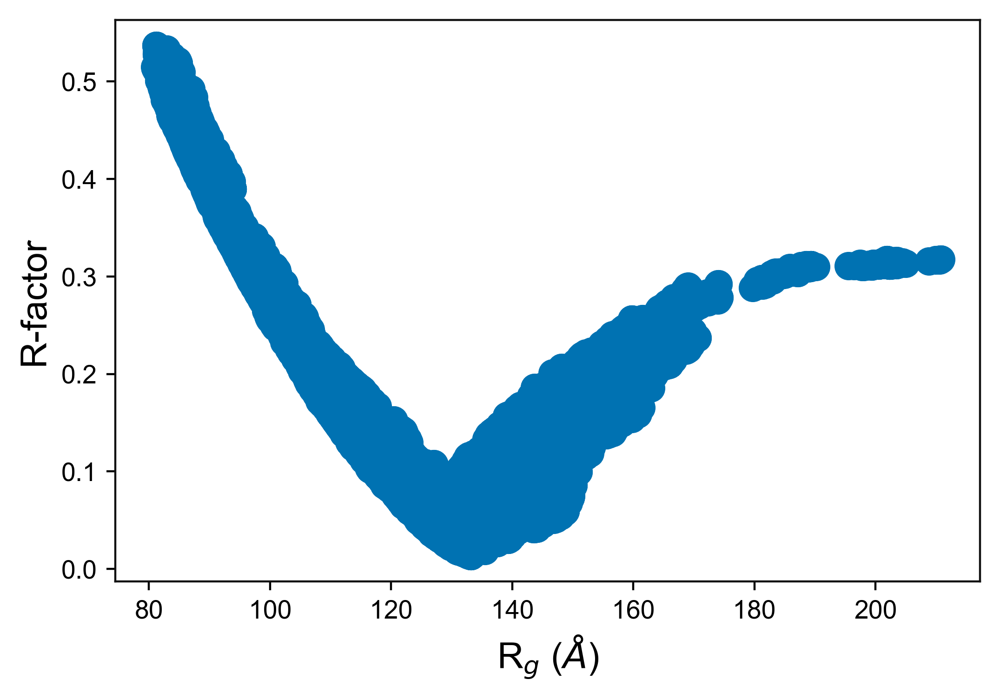

CPU times: user 13.1 s, sys: 56 ms, total: 13.1 s
Wall time: 13.1 s


In [11]:
def make_plot():
    fig = plt.figure()
    ax = fig.add_subplot(111)

    ax.plot(rg_df['Rg'], rg_df['R-factor'], 'o')
    ax.set_xlabel(r'R$_g$ ($\AA$)')
    ax.set_ylabel(r'R-factor')
    plt.show()

%time make_plot()

Notice that the result looks like a continuous area.  Let's try using transparency.

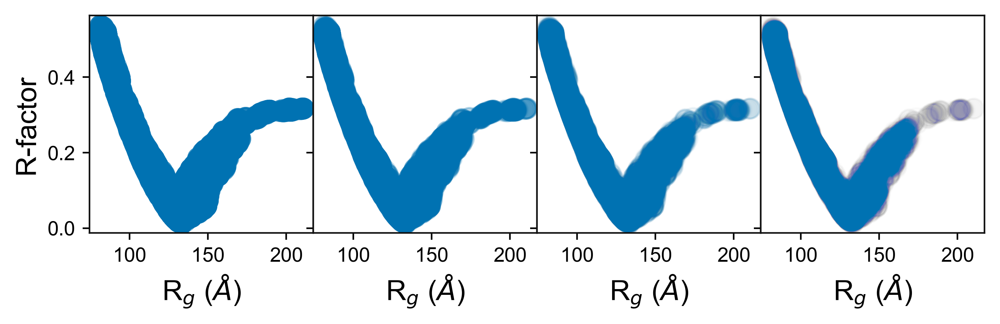

In [12]:
gs = gridspec.GridSpec(1, 4)
fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(8,2))

N = len(rg_df)

ax0.plot(rg_df['Rg'][:N], rg_df['R-factor'][:N], 'o', alpha=0.5)
ax1.plot(rg_df['Rg'][:N], rg_df['R-factor'][:N], 'o', alpha=0.1)
ax2.plot(rg_df['Rg'][:N], rg_df['R-factor'][:N], 'o', alpha=0.02)
ax3.plot(rg_df['Rg'][:N], rg_df['R-factor'][:N], 'o', alpha=0.004)

ax0.set_ylabel(r'R-factor')

all_ax = [ax0, ax1, ax2, ax3]
for ax in all_ax:
    ax.set_xlabel(r'R$_g$ ($\AA$)')

fig.subplots_adjust(wspace=0)

plt.show()

That did not improve things much.  Let's try using smaller points to improve the visual representation.

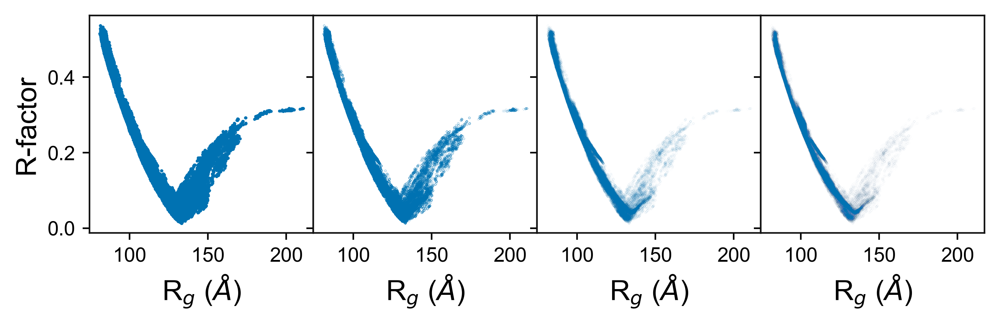

In [13]:
gs = gridspec.GridSpec(1, 4)
fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(8,2))

N = len(rg_df)

ax0.plot(rg_df['Rg'][:N], rg_df['R-factor'][:N], '.', ms=1)
ax1.plot(rg_df['Rg'][:N], rg_df['R-factor'][:N], '.', ms=0.1)
ax2.plot(rg_df['Rg'][:N], rg_df['R-factor'][:N], '.', ms=0.01)
ax3.plot(rg_df['Rg'][:N], rg_df['R-factor'][:N], '.', ms=0.001)

ax0.set_ylabel(r'R-factor')

all_ax = [ax0, ax1, ax2, ax3]
for ax in all_ax:
    ax.set_xlabel(r'R$_g$ ($\AA$)')

fig.subplots_adjust(wspace=0)

plt.show()

This starts to reveal the structure of the data but this requires several plots (and takes a long time to render).

## Now lets use `datashader` to reveal the data structure in a consolidated image
This creates static images without axes labels

### Everything in one line:

CPU times: user 372 ms, sys: 0 ns, total: 372 ms
Wall time: 373 ms


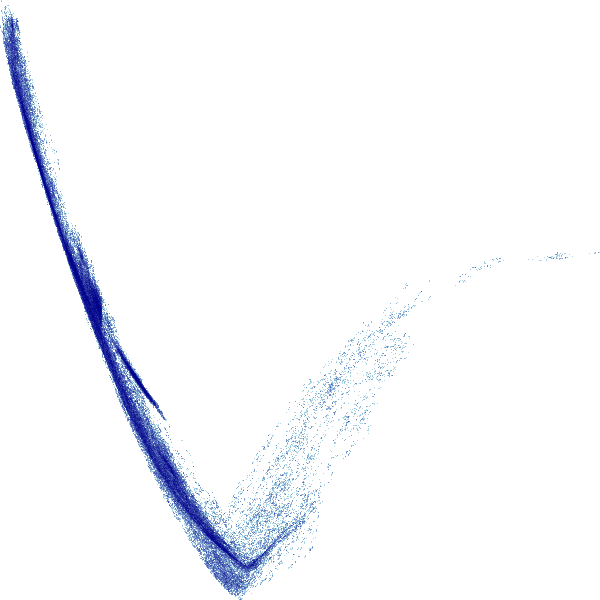

In [11]:
%time tf.shade(ds.Canvas().points(rg_df,'Rg','R-factor'))

Notice how much faster this took than the original matplotlib plot of all the data (around 250 ms instead of 13 s on my system).

### Breaking it up a bit (and add a legend):

In [12]:
# notice how I adjusted the plot_width to 600 and the height to 300 for easier comparison, adjust to fit your needs
# 1. create a canvas to put the data on
canvas = ds.Canvas(plot_width=600, plot_height=300, x_range=rg_range, y_range=r_range)
# 2. aggregate the data, the key step behind data shader
agg = canvas.points(rg_df, 'Rg', 'R-factor', agg=ds.count())
agg

<xarray.DataArray (y_axis: 300, x_axis: 600)>
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ..., 
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)
Coordinates:
  * y_axis   (y_axis) float64 0.01326 0.01501 0.01676 0.01851 0.02027 ...
  * x_axis   (x_axis) float64 80.0 80.22 80.44 80.66 80.87 81.09 81.31 81.53 ...

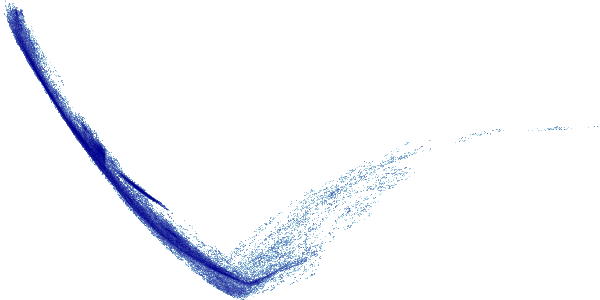

In [13]:
img = tf.shade(agg)
img

#### Lets adjust the transform function.  You can specify how the data values should map into colors: 'linear', 'log', or 'eq_hist', as follows.

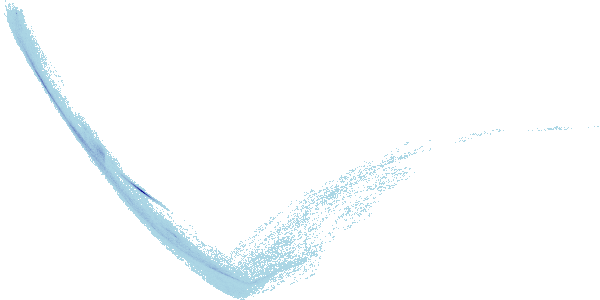

In [14]:
tf.shade(agg, how='linear') 
# linear does not accentuate the variation (not much gained by using datashader)

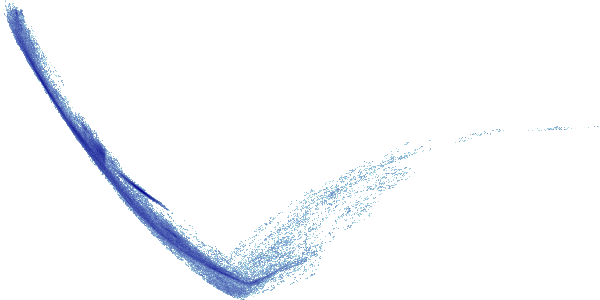

In [15]:
tf.shade(agg, how='log')
# log looks better than linear

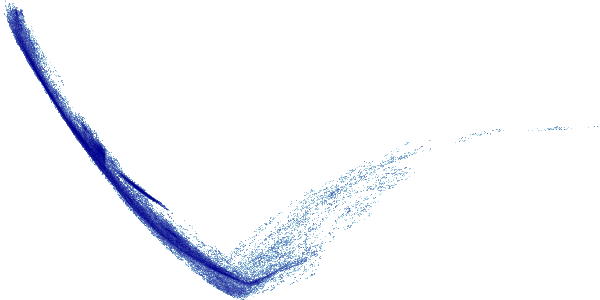

In [16]:
tf.shade(agg, how='eq_hist')
# equalization of the histogram looks great

### again with some color contrast

In [17]:
palette = ['navy', 'orange']

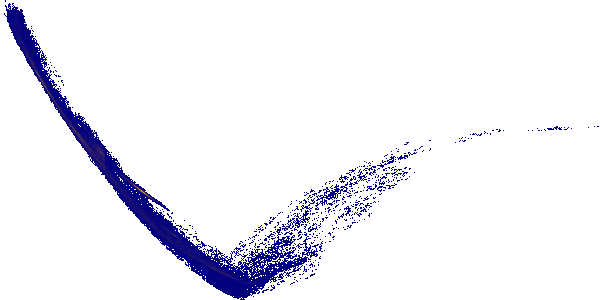

In [18]:
tf.shade(agg, cmap=palette, how='linear') 
# linear does not accentuate the variation (not much gained by using datashader)

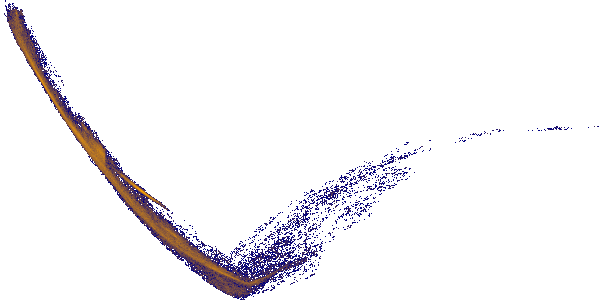

In [19]:
tf.shade(agg, cmap=palette, how='log')
# log looks better than linear

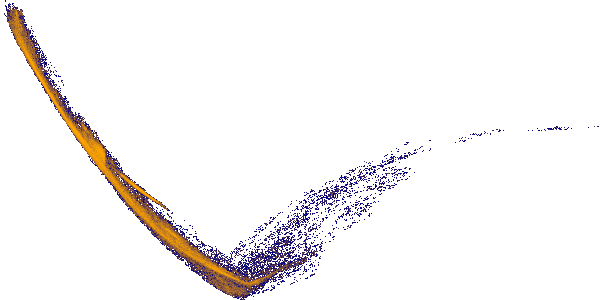

In [20]:
tf.shade(agg, cmap=palette, how='eq_hist')
# equalization of the histogram looks great

Notice how little of the color range is being used for the `'linear'` case, because the high end (orange) is used only for the single pixel with the highest density, whereas a `'linear'` mapping results in all the rest having values near the low end of the colormap. The `'log'` mapping has similar issues, though less severe because it maps a wide range of data values into a smaller range for plotting. The `'eq_hist'` (default) setting correctly conveys the differences in density between the various distributions, by equalizing the histogram of pixel values such that every pixel color is used equally often.

## Label plots using bokeh

### only 1 color (default color)

In [21]:
width = 600
height = 300

canvas = ds.Canvas(plot_width=width, plot_height=height, x_range=rg_range, y_range=r_range)
agg = canvas.points(rg_df, 'Rg', 'R-factor', agg=ds.count())
# agg = canvas.points(rg_df, 'Rg', 'R-factor')
img = tf.shade(agg, how='eq_hist')

fig = bokeh.plotting.Figure(x_range=rg_range, y_range=r_range, 
                            plot_width=width, plot_height=height, 
                            x_axis_label='Rg', y_axis_label='R-factor') 
                            
fig.image_rgba(image=[img.data], x=rg_range[0], y=r_range[0],
               dw=[rg_range[1]-rg_range[0]], dh=[r_range[1]-r_range[0]])

bokeh.plotting.show(fig)

Notice that while bokeh provides interactivity, updating the plotting ranges does not call the datashader's aggregate function to update the pixel binning.  I will demonstrate this later.

### only 1 color (my choice)

In [22]:
palette = ['white', 'firebrick']
width = 600
height = 300

canvas = ds.Canvas(plot_width=width, plot_height=height, x_range=rg_range, y_range=r_range)
agg = canvas.points(rg_df, 'Rg', 'R-factor', agg=ds.count())
# agg = canvas.points(rg_df, 'Rg', 'R-factor')
img = tf.shade(agg, cmap=palette, how='eq_hist')

fig = bokeh.plotting.Figure(x_range=rg_range, y_range=r_range, 
                            plot_width=width, plot_height=height, 
                            x_axis_label='Rg', y_axis_label='R-factor') 
                            
fig.image_rgba(image=[img.data], x=rg_range[0], y=r_range[0],
               dw=[rg_range[1]-rg_range[0]], dh=[r_range[1]-r_range[0]])

bokeh.plotting.show(fig)

Notice that in order to get a single color of my choice, I actually used a palette with 2 colors, `'white'` for the low values (to blend in with the background), and `'firebrick'` for the high values.

### Now with a legend ([issues exist for some cases](https://github.com/bokeh/datashader/issues/276))

In [27]:
height = 300
width = 600
palette = ['white', 'navy']
how = 'eq_hist'
canvas = ds.Canvas(plot_width=width, plot_height=height,
                   x_range=rg_range, y_range=r_range,
                   x_axis_type='linear')

agg = canvas.points(rg_df, 'Rg', 'R-factor')
img = tf.shade(agg, cmap=palette, how=how)
fig = bokeh.plotting.Figure(x_range=rg_range, y_range=r_range,
             plot_width=width, plot_height=height,
             x_axis_label='Rg', y_axis_label='R-factor',
             # tools='',  # uncomment this line to hide the bokeh tools
             )
fig.image_rgba(image=[img.data], x=rg_range[0], y=r_range[0],
               dw=[rg_range[1]-rg_range[0]], dh=[r_range[1]-r_range[0]])

bokeh.plotting.show(fig)

legend_fig = create_ramp_legend(agg, palette, how=how, width=width)
                                
bokeh.plotting.show(legend_fig)

AssertionError: 

In [28]:
height = 300
width = 600
from bokeh.palettes import Viridis256 as palette 
how = 'eq_hist'

canvas = ds.Canvas(plot_width=width, plot_height=height,
                   x_range=rg_range, y_range=r_range)

agg = canvas.points(rg_df, 'Rg', 'R-factor')
img = tf.shade(agg, cmap=palette, how=how)
fig = bokeh.plotting.Figure(x_range=rg_range, y_range=r_range,
             plot_width=width, plot_height=height,
             x_axis_label='Rg', y_axis_label='R-factor',
             # tools='',  # uncomment this line to hide the bokeh tools
             )
fig.image_rgba(image=[img.data], x=rg_range[0], y=r_range[0],
               dw=[rg_range[1]-rg_range[0]], dh=[r_range[1]-r_range[0]])

bokeh.plotting.show(fig)

legend_fig = create_ramp_legend(agg, palette, how=how, width=width)
bokeh.plotting.show(legend_fig)

AssertionError: 

## Interactive Plots
Try zooming in/out for these plots to see it update the shading on the fly.

### only 1 color (default color)

In [29]:
p1 = bokeh.plotting.figure(x_range=rg_range, y_range=r_range, width=600, height=300,
                           x_axis_label='Rg', y_axis_label='R-factor')

# setup the interactive plotting callback (uses **global** variables)
def image_callback(x_range, y_range, w, h):
    canvas = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = canvas.points(rg_df, 'Rg', 'R-factor', agg=ds.count())
    img = tf.shade(agg, how='eq_hist')
    return tf.dynspread(img, threshold=0.25)

InteractiveImage(p1, image_callback)

### only 1 color (my choice)

In [29]:
palette=['white', 'firebrick']

p1 = bokeh.plotting.figure(x_range=rg_range, y_range=r_range, width=600, height=300,
                           x_axis_label='Rg', y_axis_label='R-factor')

# setup the interactive plotting callback (uses **global** variables)
def image_callback(x_range, y_range, w, h):
    canvas = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = canvas.points(rg_df, 'Rg', 'R-factor', agg=ds.count())
    img = tf.shade(agg, cmap=palette, how='eq_hist')
    return tf.dynspread(img, threshold=0.25)

InteractiveImage(p1, image_callback)

### 2 distinct colors

In [30]:
palette = ['navy', 'orange']

p2 = bokeh.plotting.figure(x_range=rg_range, y_range=r_range, width=600, height=300,
                           x_axis_label='Rg', y_axis_label='R-factor')

def image_callback(x_range, y_range, w, h):
    canvas = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = canvas.points(rg_df, 'Rg', 'R-factor', agg=ds.count())
    img = tf.shade(agg, cmap=palette, how='eq_hist')
    return tf.dynspread(img, threshold=0.25)

InteractiveImage(p2, image_callback)

### a discrete colormap (11 discrete colors)

In [31]:
# get a color map
from bokeh.palettes import Viridis11 as palette

p11 = bokeh.plotting.figure(x_range=rg_range, y_range=r_range, width=600, height=300,
                            x_axis_label='Rg', y_axis_label='R-factor')

def image_callback(x_range, y_range, w, h):
    canvas = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = canvas.points(rg_df, 'Rg', 'R-factor', agg=ds.count())
    img = tf.shade(agg, cmap=palette, how='eq_hist')
    return tf.dynspread(img, threshold=0.25)

InteractiveImage(p11, image_callback)

### a [more] continuous colormap

In [32]:
# get a color map
from bokeh.palettes import Viridis256 as palette

p256 = bokeh.plotting.figure(x_range=rg_range, y_range=r_range, width=600, height=300,
                             x_axis_label='Rg', y_axis_label='R-factor')

def image_callback(x_range, y_range, w, h):
    canvas = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = canvas.points(rg_df, 'Rg', 'R-factor', agg=ds.count())
    img = tf.shade(agg, cmap=palette, how='eq_hist')
    return tf.dynspread(img, threshold=0.25)

InteractiveImage(p256, image_callback)

# Questions to explore in the future

1. How do I make a legend update interactively?
2. How would I use these tools to generate a static image file for a publications?  This may require `matplotlib` to accopmlish all these goals:
    * include axis labels
    * include both the legend and the plot in the same image file
    * would be great to have LaTeX formatting to include special characters and subscripts in labels
    * can the image generation be headless, i.e., saved to a file as part of a script?    
    
3. Is bokeh required to add the axis labels or can this be done in datashader?  (I think the answer is, "Yes, bokeh is required.")